In [ ]:
import torch 
import os 
import sys
from collections import Counter
from torchvision import datasets, transforms
import copy
from tqdm import tqdm
from urllib import request
import zipfile
import numpy as np
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, WeightedRandomSampler
sys.path.insert(0, '..')

from torchinfo import summary 
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_curve, auc
from src.model_builder import XceptionCustom  
import matplotlib.pyplot as plt
import torch.nn.functional as F
from PIL import Image
from torch.autograd import Variable
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from sklearn.linear_model import LinearRegression
from torchvision.transforms.functional import to_pil_image

import lime
from lime import lime_image
from skimage.io import imread
from src.dataloaders import *
from src.utils import *
import warnings
from scipy.spatial.distance import pdist, squareform
from sklearn.linear_model import Ridge
from pathlib import Path 
warnings.filterwarnings('ignore')
from sklearn.metrics.pairwise import cosine_distances

from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import shortest_path
from skimage.measure import regionprops

import torch.nn.functional as F
from sklearn.metrics import pairwise_distances
import networkx as nx
from scipy.stats import multivariate_normal


sys.path.append(os.path.dirname(os.getcwd()))

In [ ]:
test_dir = '~/uncertainty/data_polar_lows/polar-lows/test'
train_dir = '~/uncertainty/data_polar_lows/polar-lows/train'

# for local experiments 
# test_dir = '/Users/nicologrometto/Documents/interpretability/data/test'
# train_dir = '/Users/nicologrometto/Documents/interpretability/data/train'

device = get_device('auto')
print(device)

cuda


In [ ]:
train_transform, test_transform = get_transforms() 
train_loader, test_loader, n_pos_train, n_neg_train, class_to_idx_dict = create_dataloaders(train_dir=train_dir,
                                                                                test_dir=test_dir,
                                                                                train_transform=train_transform,
                                                                                test_transform=test_transform)
print(class_to_idx_dict)

# Load the best model weights
model = XceptionCustom(input_channels=3)
model.load_state_dict(torch.load('../src/outputs/20.08.25_polar_lows_customex.pth'))

# for local experiments
# model.load_state_dict(torch.load('../models_local/trained_base_model.pth'))


# evaluate model 
y_pred_labels_np, y_true_np, y_pred_probs_np, misclassified_images, misclassified_true_labels, misclassified_pred_labels, misclassified_prob_vectors = evaluate_model(model, test_loader, device)

# Print classification report
print("\nClassification Report on Test Set:")
print(classification_report(y_true_np, y_pred_labels_np))
print(f"\nFound {len(misclassified_images)} misclassified images.")

Positive training samples: 254 (16%), Negative training samples: 1293 (83%)
{'neg': 0, 'pos': 1}

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       371
           1       0.92      0.95      0.94        64

    accuracy                           0.98       435
   macro avg       0.96      0.97      0.96       435
weighted avg       0.98      0.98      0.98       435


Found 8 misclassified images.


In [ ]:
print(f'Size of misclassified images: {misclassified_images[0].shape}') 


Size of misclassified images: torch.Size([3, 512, 512])


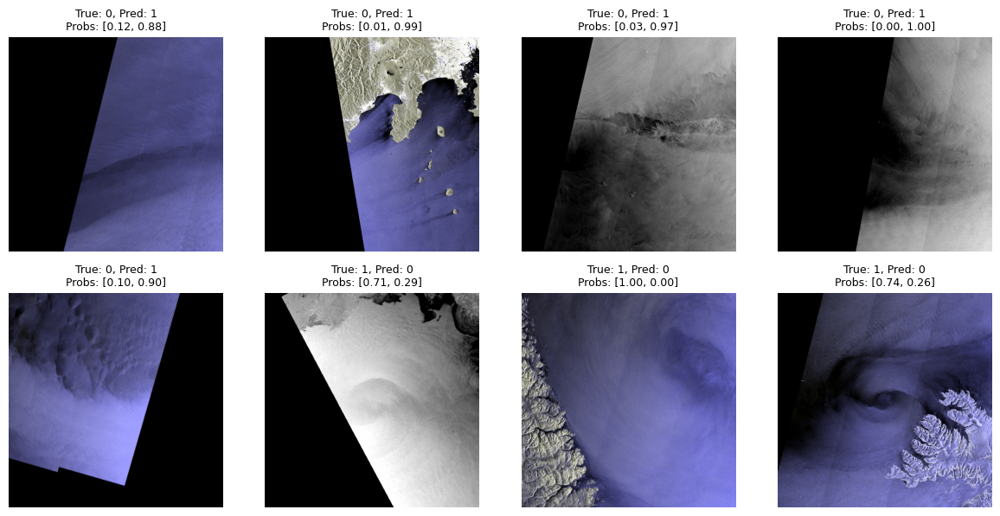

In [ ]:
# --- plot misclassified images with probabilities ---
fig, axes = plt.subplots(4, 4, figsize=(12, 12)) 
axes = axes.flatten() 

for i in range(len(misclassified_images)):
    ax = axes[i]
    img = misclassified_images[i].permute(1, 2, 0).numpy()
    ax.imshow(img)

    prob_vec = misclassified_prob_vectors[i].numpy()
    subtitle = f"True: {misclassified_true_labels[i]}, Pred: {misclassified_pred_labels[i]}\nProbs: [{prob_vec[0]:.2f}, {prob_vec[1]:.2f}]"
    ax.set_title(subtitle, fontsize=9) 
    ax.axis('off') 

for j in range(len(misclassified_images), 16):
    fig.delaxes(axes[j])

plt.tight_layout() 
plt.show()

Original image size: (800, 800)
Transformed image shape: torch.Size([3, 512, 512])
Transformed image dtype: torch.float32
Transformed image range: [0.000, 1.000]


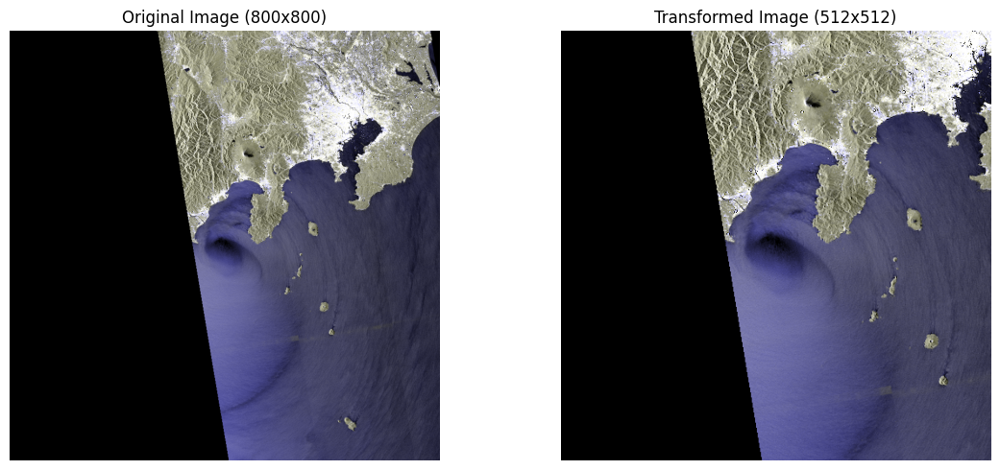

Batched image shape for model input: torch.Size([1, 3, 512, 512])


tensor([[0.0011, 0.9989]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


In [ ]:
# Load sample image
image_path = '/home/nlfrx7981/uncertainty/data_polar_lows/polar-lows/test/pos/cffe42_20191012T084028_20191012T084212_mos_rgb.png'
image = get_image(image_path)

print(f"Original image size: {image.size}")

train_transform, test_transform = get_transforms()

transformed_image = test_transform(image)

print(f"Transformed image shape: {transformed_image.shape}")
print(f"Transformed image dtype: {transformed_image.dtype}")
print(f"Transformed image range: [{transformed_image.min():.3f}, {transformed_image.max():.3f}]")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Original image
axes[0].imshow(image)
axes[0].set_title(f"Original Image ({image.size[0]}x{image.size[1]})")
axes[0].axis('off')

transformed_display = transformed_image.permute(1, 2, 0)  # CHW -> HWC
axes[1].imshow(transformed_display)
axes[1].set_title(f"Transformed Image ({transformed_image.shape[1]}x{transformed_image.shape[2]})")
axes[1].axis('off')

plt.tight_layout()
plt.show()

batched_image = transformed_image.unsqueeze(0)  # Shape: (1, 3, 512, 512)
print(f"Batched image shape for model input: {batched_image.shape}")

model.eval()
logits_sample_img = model(batched_image.to(device))
print(torch.softmax(logits_sample_img, dim=1)) 

In [ ]:
########
### COMPLETE LIME IMPLEMENTATION
########

def prepare_image_for_lime(transformed_image):
    """Convert PyTorch tensor to numpy array format expected by LIME"""
    if isinstance(transformed_image, torch.Tensor):
        img_np = transformed_image.detach().cpu().numpy()
        if img_np.shape[0] == 3 or img_np.shape[0] == 1:  
            img_np = np.transpose(img_np, (1, 2, 0))  # CHW -> HWC
        if img_np.max() <= 1.0:  
            img_np = (img_np * 255).astype(np.uint8)
        else:
            img_np = img_np.astype(np.uint8)
        return img_np
    return transformed_image


def batch_predict(images, model, device):
    """
    Prediction function for LIME that converts numpy arrays back to tensors
    
    Args:
        images: numpy array of shape (batch_size, height, width, channels)
        model: PyTorch model
        device: PyTorch device
        
    Returns:
        numpy array of predictions
    """
    if isinstance(images, np.ndarray):
        if len(images.shape) == 4:  
            images_tensor = torch.from_numpy(images).permute(0, 3, 1, 2).float()
        else:  
            images_tensor = torch.from_numpy(images).permute(2, 0, 1).float().unsqueeze(0)
        
        if images_tensor.max() > 1.0:
            images_tensor = images_tensor / 255.0
            
        images_tensor = images_tensor.to(device)
    else:
        images_tensor = images

    # Get model predictions
    model.eval()
    with torch.no_grad():
        predictions = torch.softmax(model(images_tensor), dim=1)
    
    # Convert to numpy for LIME
    if isinstance(predictions, torch.Tensor):
        predictions = predictions.detach().cpu().numpy()
    
    return predictions


def custom_slic_segmentation(image, n_superpixels, compactness, sigma=1):
    """Custom SLIC segmentation function for LIME"""
    return slic(
        image=image, 
        n_segments=n_superpixels, 
        compactness=compactness,
        start_label=0,
        sigma=sigma, 
        channel_axis=-1
    )


def run_standard_lime(model, transformed_image, device, n_samples, n_superpixels, compactness, top_k=10):
    """
    Run standard LIME explanation with reconciled plotting
    """
    
    lime_image_np = prepare_image_for_lime(transformed_image)
    
    def predict_fn(images):
        return batch_predict(images, model, device)
    
    def segmentation_fn(image):
        return custom_slic_segmentation(image, n_superpixels, compactness)
    
    explainer = lime_image.LimeImageExplainer()
    
    # Generate explanation
    explanation = explainer.explain_instance(
        lime_image_np,
        predict_fn,
        top_labels=2,
        num_samples=n_samples,
        segmentation_fn=segmentation_fn  
    )
    
    # Get segmentation used by LIME for visualization
    segments = segmentation_fn(lime_image_np)
    
    # Extract LIME feature importance scores
    segments_and_scores = explanation.local_exp[explanation.top_labels[0]]
    
    # Create LIME coefficient heatmap
    lime_coeff_map = np.zeros_like(segments, dtype=float)
    for seg_id, score in segments_and_scores:
        mask = (segments == seg_id)
        lime_coeff_map[mask] = score
    
    plt.figure(figsize=(18, 6))
    
    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(lime_image_np)
    plt.title('Original Image')
    plt.axis('off')

    # Superpixel segmentation
    plt.subplot(1, 3, 2)
    boundary_img = mark_boundaries(lime_image_np/255.0, segments, color=(1, 1, 0))
    plt.imshow(boundary_img)
    plt.title(f'Superpixels\n({np.max(segments)} segments)')
    plt.axis('off')
    

    plt.subplot(1, 3, 3)
    im = plt.imshow(lime_coeff_map, cmap='RdBu_r', alpha=0.9)
    plt.title('LIME Feature Importance\n(Red=Pos, Blue=Neg)')
    #plt.colorbar(im, fraction=0.046, pad=0.04)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return explanation, lime_image_np, segments

Generating LIME explanation...


100%|██████████| 1000/1000 [00:12<00:00, 79.25it/s]


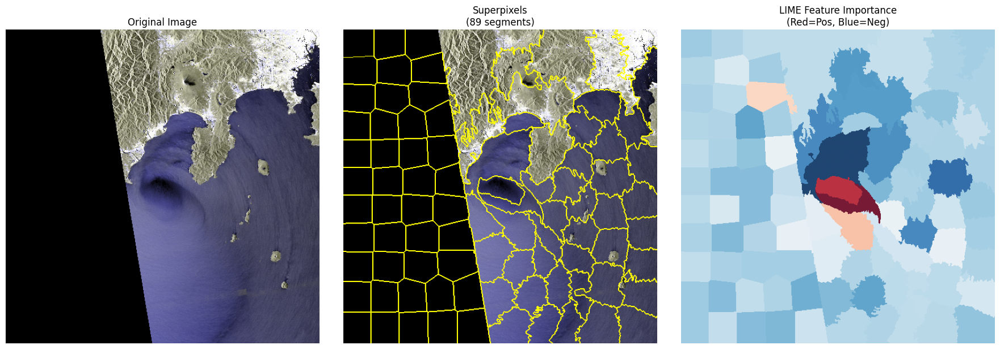

Generating LIME explanation...


100%|██████████| 1000/1000 [00:08<00:00, 113.81it/s]


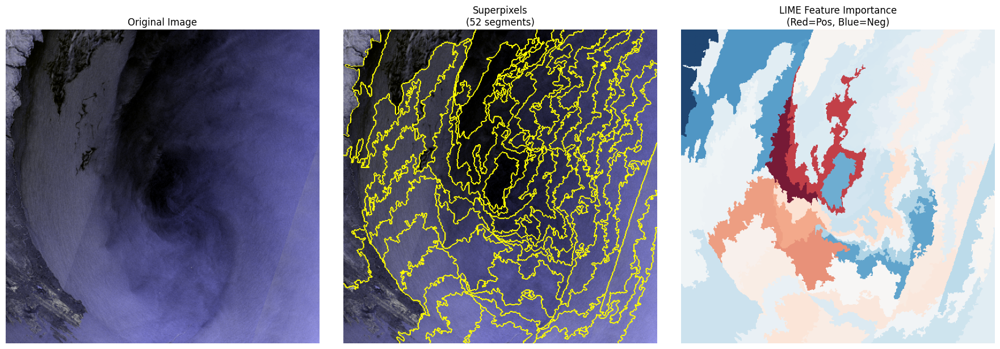

In [ ]:
image_path = '/home/nlfrx7981/uncertainty/data_polar_lows/polar-lows/test/pos/cffe42_20191012T084028_20191012T084212_mos_rgb.png'
image = get_image(image_path)
transformed_image = test_transform(image)

explanation, lime_image_np, segments = run_standard_lime(
    model, transformed_image, device, 
    n_samples=1000,  # Match simple
    n_superpixels=130, 
    compactness=5,  # Match simple
    top_k=5
)

###

image_path = '/home/nlfrx7981/uncertainty/data_polar_lows/polar-lows/test/pos/e8b0d4_20181231T025037_20181231T025219_mos_rgb.png'
image = get_image(image_path)
transformed_image = test_transform(image)

explanation, lime_image_np, segments = run_standard_lime(
    model, transformed_image, device, 
    n_samples=1000,  # Match simple
    n_superpixels=60, 
    compactness=1,  # Match simple
    top_k=5
)

# Continuous LIME

In [ ]:
def custom_slic_segmentation(image, n_superpixels=130, compactness=5, start_label=1, sigma=1):
 
    image = img_as_float(image)  # normalize to [0, 1]
    segments = slic(
        image,
        n_segments=n_superpixels,
        compactness=compactness,
        sigma=sigma,
        start_label=start_label,
        channel_axis=-1 if image.ndim == 3 else None
    )
    return segments 


def uniform_blurred_sampling(image, num_samples):

    # Generate superpixels
    segments = custom_slic_segmentation(image)
    unique_segments = np.unique(segments)
    
    # Generate all weights
    interp_features = np.random.uniform(0, 1, size=(num_samples, len(unique_segments)))
    
    # Convert image to float
    base_image = image.copy().astype(np.float32)
    
    # Create a mapping from segment IDs to indices for vectorization
    seg_to_idx = {seg_id: idx for idx, seg_id in enumerate(unique_segments)}
    
    # Create index map for vectorized operations
    segment_indices = np.zeros_like(segments)
    for seg_id, idx in seg_to_idx.items():
        segment_indices[segments == seg_id] = idx
    
    samples = []
    for sample_idx in range(num_samples):
        # Create weight map for this sample
        weight_map = interp_features[sample_idx][segment_indices]
        
        # Apply weights (broadcast across color channels if needed)
        if len(base_image.shape) == 3:
            weight_map = weight_map[:, :, np.newaxis]
        
        blurred_image = base_image * weight_map
        
        # Normalize if needed
        if image.dtype == np.uint8:
            samples.append(blurred_image / 255.0)
        else:
            samples.append(blurred_image)
    
    return samples, segments, interp_features


def explain_image(image, n_samples=1000):
    """
    Generate explanation for an image using uniformly blurred samples
    """
    blurred_samples, segments, interp_features = uniform_blurred_sampling(lime_image_np, n_samples)
    
    # Create perturbed images and get predictions
    predictions = []
    model.eval()
    
    for sample in tqdm(blurred_samples):
        
        input_tensor = torch.from_numpy(sample).permute(2, 0, 1).unsqueeze(0).float().to(device)
        
        with torch.inference_mode():
            logits = model(input_tensor)
            probs = torch.softmax(logits, dim=1)
            pred = probs.cpu().numpy()[0]
            predictions.append(pred)
    
    predictions = np.array(predictions)
    
    # Get prediction for original image
    input_orig = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).float().to(device)
    with torch.inference_mode():
        orig_logits = model(input_orig)
        orig_probs = torch.softmax(orig_logits, dim=1).cpu().numpy()[0]
    
    target_class = np.argmax(orig_probs)
    y = predictions[:, target_class]
    
    ridge = Ridge(alpha=0.01) # practically irrelevant

    # cosine dist weights 
    original_weights = np.ones(interp_features.shape[1])
    cosine_dist = cosine_distances(interp_features, original_weights.reshape(1, -1)).flatten()
    sample_weights = np.exp(-cosine_dist / 0.01)  


    ridge.fit(interp_features, y, sample_weight=sample_weights)
    #ridge.fit(interp_features, y)
    
    return ridge.coef_, segments 


def plot_top_k_segments_with_boundaries(img, segments_slic, beta, k=5, boundary_color=(1, 1, 0)):
    """
    Plot the original image with yellow boundaries around the union of the top-k most important superpixels.

    Args:
        img (np.ndarray): Original image, shape (H, W, C).
        segments_slic (np.ndarray): Superpixel labels, shape (H, W).
        beta (np.ndarray): Importance coefficients for each superpixel.
        k (int): Number of top superpixels to highlight.
        boundary_color (tuple): RGB color for the superpixel boundaries.
    """
    # Get top-k superpixel indices
    top_k_indices = np.argsort(beta)[-k:]

    # Create a mask to keep only top-k segments
    mask = np.isin(segments_slic, top_k_indices)

    # Create a new segment map where non-top-k segments are assigned a dummy label (-1)
    # and all top-k segments are merged into a single label (e.g., 0)
    masked_segments = np.full_like(segments_slic, fill_value=-1)
    masked_segments[mask] = 0  # merge all selected superpixels into one segment

    # Plot with yellow boundaries
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(mark_boundaries(img, masked_segments, color=boundary_color, mode='thick'))
    ax.set_title(f"Top-{k} Superpixels (Merged with Yellow Boundaries)")
    ax.axis('off')
    plt.show()



## ignore below
'''
def uniform_blurred_samples(image, num_samples, n_superpixels=100, compactness=10, sigma=1, start_label=1):
    """
    Generate multiple samples of uniformly blurred images using superpixels.
    """
    
    # Generate superpixels once 
    segments = slic(image, n_superpixels, compactness)
    unique_segments = np.unique(segments)
    
    # Generate ALL weights at once - shape (num_samples, n_superpixels)
    interp_features = np.random.uniform(0, 1, size=(num_samples, len(unique_segments)))
    
    # Convert image to float once
    base_image = image.copy().astype(np.float32)
    
    samples = []
    
    for sample_idx in range(num_samples):
        # Start with a fresh copy of the base image for each sample
        blurred_image = base_image.copy()
        
        # Apply the weights for THIS sample
        for i, segment_id in enumerate(unique_segments):
            mask = segments == segment_id
            blurred_image[mask] = blurred_image[mask] * interp_features[sample_idx, i]
        
        # Handle normalization 
        if image.dtype == np.uint8:
            samples.append(blurred_image / 255.0)  # Normalize uint8 images
        else:
            samples.append(blurred_image)  # Keep original scale for float images
    
    return samples, segments  # Return segments for potential reuse
'''
    
#blurred_samples, segments, interp_features = uniform_blurred_samples_vectorized(lime_image_np, 100)

'\ndef uniform_blurred_samples(image, num_samples, n_superpixels=100, compactness=10, sigma=1, start_label=1):\n    """\n    Generate multiple samples of uniformly blurred images using superpixels.\n    """\n\n    # Generate superpixels once \n    segments = slic(image, n_superpixels, compactness)\n    unique_segments = np.unique(segments)\n\n    # Generate ALL weights at once - shape (num_samples, n_superpixels)\n    interp_features = np.random.uniform(0, 1, size=(num_samples, len(unique_segments)))\n\n    # Convert image to float once\n    base_image = image.copy().astype(np.float32)\n\n    samples = []\n\n    for sample_idx in range(num_samples):\n        # Start with a fresh copy of the base image for each sample\n        blurred_image = base_image.copy()\n\n        # Apply the weights for THIS sample\n        for i, segment_id in enumerate(unique_segments):\n            mask = segments == segment_id\n            blurred_image[mask] = blurred_image[mask] * interp_features[sample_id

100%|██████████| 1000/1000 [00:01<00:00, 765.86it/s]


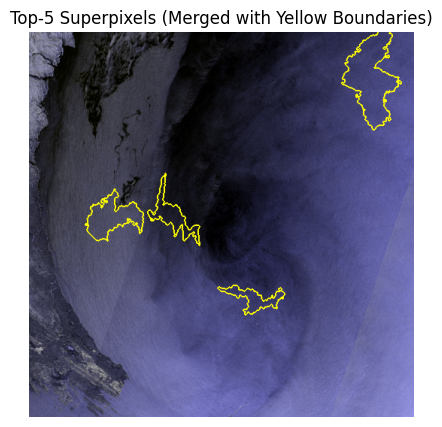

In [ ]:
explanation, segments = explain_image(lime_image_np, n_samples=1000)
plot_top_k_segments_with_boundaries(lime_image_np, segments, explanation, k=5)


In [ ]:
def plot_explanation_with_samples(image, segments, beta, interp_features=None, sample_idx=0,
                                  cmap="seismic", center_zero=True):
    """
    Plot three side-by-side panels:
      1. Original image
      2. Uniformly sampled image using superpixels
      3. LIME-style heatmap of superpixel importance

    Args:
        image (np.ndarray): Original image, shape (H, W, C)
        segments (np.ndarray): Superpixel segmentation map, shape (H, W)
        beta (np.ndarray): Importance coefficients, length = number of superpixels
        interp_features (np.ndarray): (num_samples, num_superpixels) sampled weights
        sample_idx (int): Index of the sample to visualize
        cmap (str): Colormap for heatmap
        center_zero (bool): If True, center colormap around 0 for positive/negative contributions
    """
    # Create coefficient heatmap
    heatmap = np.zeros_like(segments, dtype=float)
    for seg_id, score in zip(np.unique(segments), beta):
        heatmap[segments == seg_id] = score

    # Create uniformly sampled image 
    sampled_image = None
    if interp_features is not None:
        weight_map = interp_features[sample_idx][np.vectorize({seg_id: idx for idx, seg_id in 
                                                              enumerate(np.unique(segments))}.get)(segments)]
        if image.ndim == 3:
            weight_map = weight_map[..., np.newaxis]
        sampled_image = img_as_float(image).astype(np.float32) * weight_map

    # Plotting
    n_cols = 3 if sampled_image is not None else 2
    fig, axes = plt.subplots(1, n_cols, figsize=(5*n_cols, 5))

    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    if sampled_image is not None:
        axes[1].imshow(sampled_image)
        axes[1].set_title(f"Sample (Uniform Superpixel Weights)")
        axes[1].axis("off")

    col_idx = 2 if sampled_image is not None else 1
    axes[col_idx].imshow(image, alpha=0.5)
    im = axes[col_idx].imshow(heatmap, cmap='RdBu_r', alpha=0.9)
    axes[col_idx].set_title("Superpixel Importance Heatmap")
    axes[col_idx].axis("off")

    plt.tight_layout()
    plt.show()


100%|██████████| 10000/10000 [00:19<00:00, 526.13it/s]


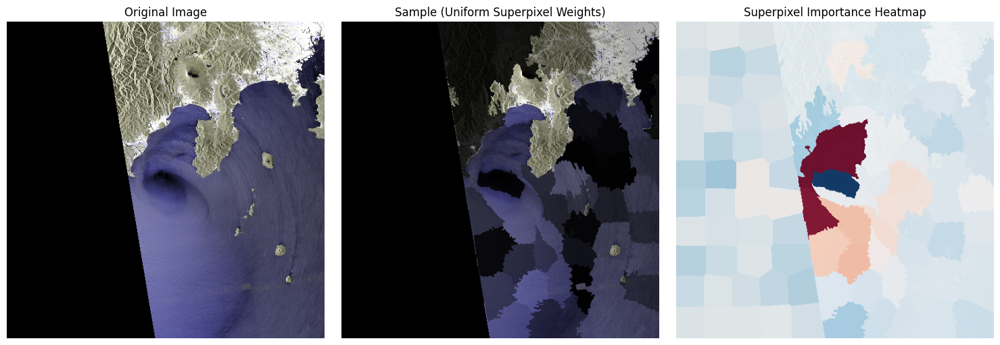

In [ ]:
image_path = '/home/nlfrx7981/uncertainty/data_polar_lows/polar-lows/test/pos/cffe42_20191012T084028_20191012T084212_mos_rgb.png'
image = get_image(image_path)
transformed_image = test_transform(image)
lime_image_np = prepare_image_for_lime(transformed_image)

beta, segments = explain_image(lime_image_np, n_samples=10000)

# Retrieve samples and interp_features from uniform_blurred_sampling
samples, segments, interp_features = uniform_blurred_sampling(lime_image_np, num_samples=10)

# Plot with a chosen sampled image (e.g., sample #3)
plot_explanation_with_samples(lime_image_np, segments, beta, interp_features, sample_idx=3)


100%|██████████| 10000/10000 [00:13<00:00, 726.65it/s]


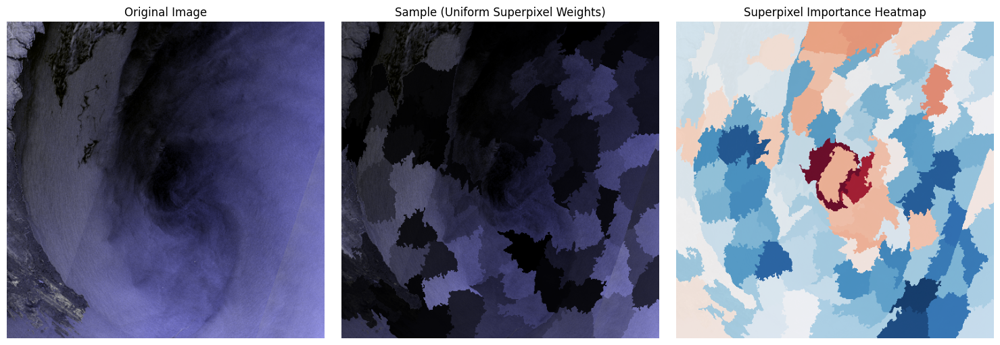

In [ ]:
image_path = '/home/nlfrx7981/uncertainty/data_polar_lows/polar-lows/test/pos/e8b0d4_20181231T025037_20181231T025219_mos_rgb.png'
image = get_image(image_path)
transformed_image = test_transform(image)
lime_image_np = prepare_image_for_lime(transformed_image)

beta, segments = explain_image(lime_image_np, n_samples=10000)

# Retrieve samples and interp_features from uniform_blurred_sampling
samples, segments, interp_features = uniform_blurred_sampling(lime_image_np, num_samples=10)

# Plot with a chosen sampled image 
plot_explanation_with_samples(lime_image_np, segments, beta, interp_features, sample_idx=3)


# Bayes LIME

In [ ]:
class BayesLIME: 
    def __init__(self, model, image):
        self.model = model 
        self.image = image
        self.device = next(model.parameters()).device


    def custom_slic_segmentation(self, image, n_superpixels, compactness, sigma=1):
        """Custom SLIC segmentation function for LIME"""
        return slic(
            image=image, 
            n_segments=n_superpixels, 
            compactness=compactness,
            start_label=0,
            sigma=sigma, 
            channel_axis=-1
    )
    
    def get_superpixel_centers(self, superpixels):
        """Get centroid coordinates for each superpixel"""
        props = regionprops(superpixels + 1)  # regionprops expects 1-indexed labels
        centers = np.array([[prop.centroid[0], prop.centroid[1]] for prop in props])
        return centers

    
    def plot_image_boundaries_centers(self, image, superpixels, centers):
        plt.figure(figsize=(3, 3))
        plt.imshow(mark_boundaries(image, superpixels))

        # Unpack the centers into x and y for plotting
        y_coords, x_coords = zip(*centers)

        plt.scatter(x_coords, y_coords, c='red', s=30, marker='x')  # Plot centers
        plt.title('Superpixels with Centers')
        plt.show()


    
    def build_superpixel_graph(self, superpixels):
        """
        Build adjacency graph where superpixels are connected if they share a boundary
        Returns:
            adjacency_matrix: matrix (n_superpixels, n_superpixels) WITHOUT self-loops
            degree_matrix: diagonal matrix with degrees
        """
        n_superpixels = superpixels.max() + 1
        h, w = superpixels.shape
        
        # Find adjacent superpixels by checking 4-connectivity
        adjacencies = set()
        
        # Check horizontal adjacencies
        for i in range(h):
            for j in range(w - 1):
                if superpixels[i, j] != superpixels[i, j + 1]:
                    sp1, sp2 = superpixels[i, j], superpixels[i, j + 1]
                    adjacencies.add((min(sp1, sp2), max(sp1, sp2)))
        
        # Check vertical adjacencies
        for i in range(h - 1):
            for j in range(w):
                if superpixels[i, j] != superpixels[i + 1, j]:
                    sp1, sp2 = superpixels[i, j], superpixels[i + 1, j]
                    adjacencies.add((min(sp1, sp2), max(sp1, sp2)))
        
        # Build adjacency matrix without self-loops
        row_indices = []
        col_indices = []
        
        for sp1, sp2 in adjacencies:
            row_indices.extend([sp1, sp2])
            col_indices.extend([sp2, sp1])
            
        data = np.ones(len(row_indices))
        adjacency_matrix = csr_matrix((data, (row_indices, col_indices)),
                                    shape=(n_superpixels, n_superpixels)).toarray()
        
        # Calculate degrees (sum of each row - no self-loops to remove)
        degrees = np.array(adjacency_matrix.sum(axis=1)).flatten()
        degree_matrix = np.diag(degrees)
        
        return adjacency_matrix, degree_matrix
            

    def visualize_superpixel_graph(self, superpixels, centers, adjacency_matrix):
        """Visualize the superpixel adjacency graph as a network"""
        
        # Convert sparse matrix to NetworkX graph
        G = nx.from_numpy_array(adjacency_matrix)
        
        # Remove self-loops for visualization
        G.remove_edges_from(nx.selfloop_edges(G))
        
        plt.figure(figsize=(10, 4))
        
        # Plot 1: Original image with superpixels
        plt.subplot(1, 2, 1)
        plt.imshow(mark_boundaries(self.image, superpixels))
        y_coords, x_coords = zip(*centers)
        plt.scatter(x_coords, y_coords, c='red', s=30, marker='o')
        plt.title('Superpixels')
        plt.axis('off')
        
        # Plot 2: Graph structure
        plt.subplot(1, 2, 2)
        pos = {i: (centers[i][1], -centers[i][0]) for i in range(len(centers))}  # Note: flip y for plotting
        nx.draw(G, pos, node_size=100, node_color='lightblue', 
                edge_color='gray', alpha=0.7, with_labels=True, font_size=8)
        plt.title('Superpixel Adjacency Graph')
        plt.axis('equal')
        
        plt.tight_layout()
        plt.show()


    def build_prior(self, adjacency_matrix, degree_matrix, method, eps=0.1):
        '''Return mean zero and precision matrix for GMRF'''
        n_superpixels = adjacency_matrix.shape[0]
        
        if method=='graph':
            # Graph Laplacian
            laplacian = degree_matrix - adjacency_matrix
            # Add regularization
            precision_matrix = laplacian + eps * np.eye(n_superpixels)
            return np.zeros(n_superpixels), precision_matrix
        
        elif method=='gauss':
            precision_matrix = np.identity(n_superpixels)
            return np.zeros(n_superpixels), precision_matrix 

    
    def plot_superpixel_heatmap_prior_posterior(self, superpixels, prior_mean, prior_precision, posterior_mean, posterior_precision):
        """
        Plot coefficient values mapped onto superpixels
        
        Args:
            superpixels: (H, W) array with superpixel labels
            prior_mean: 
            prior_precision:
            posterior_mean:
            posterior_precision: 
        """

        n_superpixels = len(np.unique(superpixels))
        prior_draw = multivariate_normal.rvs(prior_mean, np.linalg.inv(prior_precision), size=1)
        # Create coefficient maps
        coeff_map_prior = np.zeros_like(superpixels, dtype=float)
        for sp_id in range(n_superpixels):
            mask = (superpixels == sp_id)
            coeff_map_prior[mask] = prior_draw[sp_id]

        coeff_map_posterior_mean = np.zeros_like(superpixels, dtype=float)
        for sp_id in range(n_superpixels):
            mask = (superpixels == sp_id)
            coeff_map_posterior_mean[mask] = posterior_mean[sp_id]

        coeff_map_posterior_variance = np.zeros_like(superpixels, dtype=float)
        for sp_id in range(n_superpixels):
            mask = (superpixels == sp_id)
            coeff_map_posterior_variance[mask] = np.diag(np.linalg.inv(posterior_precision))[sp_id]
        
        plt.figure(figsize=(15, 15))
        
        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(self.image)
        plt.title('Original Image')
        plt.axis('off')
        
        # Coefficient heatmap prior
        plt.subplot(1, 3, 2)
        im = plt.imshow(coeff_map_prior, cmap='RdBu_r', alpha=0.9)
        plt.title('Prior draw')
        #plt.colorbar(im, fraction=0.046, pad=0.04)
        plt.axis('off')

        # Coefficient heatmap posterior
        plt.subplot(1, 3, 3)
        im = plt.imshow(coeff_map_posterior_mean, cmap='RdBu_r', alpha=0.9)
        plt.title('Posterior mean')
        #plt.colorbar(im, fraction=0.046, pad=0.04)
        plt.axis('off')

        '''
        # Coefficient heatmap variance
        plt.subplot(1, 4, 4)
        im = plt.imshow(coeff_map_posterior_variance, cmap='RdBu_r', alpha=0.9)
        plt.title('Posterior variance')
        plt.colorbar(im, fraction=0.046, pad=0.04)
        plt.axis('off')
        '''
        
        plt.tight_layout()
        plt.show()



    def uniform_blurred_sampling(self, image, superpixels, n_samples):
        """
        More efficient vectorized version.
        """
        unique_superpixels = np.unique(superpixels)
        
        interp_features = np.random.uniform(0, 1, size=(n_samples, len(unique_superpixels)))
        
        base_image = image.copy().astype(np.float32)
        
        seg_to_idx = {seg_id: idx for idx, seg_id in enumerate(unique_superpixels)}
        
        segment_indices = np.zeros_like(superpixels)
        for seg_id, idx in seg_to_idx.items():
            segment_indices[superpixels == seg_id] = idx
        
        samples = []
        for sample_idx in range(n_samples):
            weight_map = interp_features[sample_idx][segment_indices]
            
            if len(base_image.shape) == 3:
                weight_map = weight_map[:, :, np.newaxis]
            
            blurred_image = base_image * weight_map
            
            if image.dtype == np.uint8:
                samples.append(blurred_image / 255.0)
            else:
                samples.append(blurred_image)
        
        return samples, interp_features
    

    def spatial_sampling(self, image, superpixels, n_samples):
        """
        Vectorized distance-weighted spatial sampling
        
        For each sample:
        1. Pick a random "focus" superpixel
        2. Set sampling probability for each superpixel based on distance to focus
        3. Sample independently with these probabilities
        """
        n_superpixels = superpixels.max() + 1
        centers = self.get_superpixel_centers(superpixels)
        
        # Pre-compute distance matrix (n_superpixels x n_superpixels)
        distance_matrix = np.linalg.norm(
            centers[:, np.newaxis, :] - centers[np.newaxis, :, :], 
            axis=2
        )
        
        focus_indices = np.random.choice(n_superpixels, size=n_samples)
        
        distances_from_foci = distance_matrix[focus_indices]  # Shape: (n_samples, n_superpixels)
        
        max_distances = np.max(distances_from_foci, axis=1, keepdims=True)
        probabilities = 0.05 + 0.9 * np.exp(-distances_from_foci / max_distances)
        
        random_vals = np.random.random((n_samples, n_superpixels))
        interp_features = (random_vals < probabilities).astype(float)
        
        samples = []
        base_image = image.copy().astype(np.float32)
        
        masks = {}
        for sp_id in range(n_superpixels):
            masks[sp_id] = (superpixels == sp_id)
        
        for sample_idx in range(n_samples):
            sample_image = base_image.copy()
            feature = interp_features[sample_idx]
            
            for sp_id in range(n_superpixels):
                if feature[sp_id] == 0:
                    sample_image[masks[sp_id]] = 0
                    
            if image.dtype == np.uint8:
                samples.append(sample_image / 255.0)
            else:
                samples.append(sample_image)
        
        return samples, interp_features

    

    
    def model_predictions_perturbations(self, image, superpixels, method, n_samples):
        """
        Generate model predictions on perturbations and extract probabilities for target class
        
        Args:
            image: original image array
            superpixels: superpixel segmentation 
            n_samples: number of perturbation samples
        
        Returns:
            y: target class probabilities for perturbed samples
            interp_features: perturbation weights for each sample
            target_class: the predicted class for original image
        """
        if method=='blurred':
            # Generate samples and weights
            samples, interp_features = self.uniform_blurred_sampling(image, superpixels, n_samples)

        elif method=='spatial':
            samples, interp_features = self.spatial_sampling(image, superpixels, n_samples)
        
        predictions = []
        self.model.eval()  # Use self.model
        
        for sample in tqdm(samples):
            input_tensor = torch.from_numpy(sample).permute(2, 0, 1).unsqueeze(0).float().to(self.device)
            
            with torch.inference_mode():
                logits = self.model(input_tensor)  # Use self.model
                probs = torch.softmax(logits, dim=1)
                pred = probs.cpu().numpy()[0]
                predictions.append(pred)
        
        predictions = np.array(predictions)
        
        input_orig = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).float().to(self.device)
        with torch.inference_mode():
            orig_logits = self.model(input_orig)  # Use self.model
            orig_probs = torch.softmax(orig_logits, dim=1).cpu().numpy()[0]
        
        target_class = np.argmax(orig_probs)
        y = predictions[:, target_class]  # Extract target class probabilities
        
        return y, interp_features, target_class



    def build_MGRF_posterior(self, prior_precision, interp_features, y, sigma=0.1):   # simplest case with iid error terms - larger sigma leads to higher uncertainty in explanations - this has to be tuned - what does it mean for sigma to be larger than 1??
        posterior_precision = prior_precision + sigma**(-2)*np.dot(interp_features.T, interp_features)
        posterior_mean = np.dot(np.linalg.inv(posterior_precision), sigma**(-2)*np.dot(interp_features.T, y))
        return posterior_mean, posterior_precision

LIME image size: (512, 512, 3)


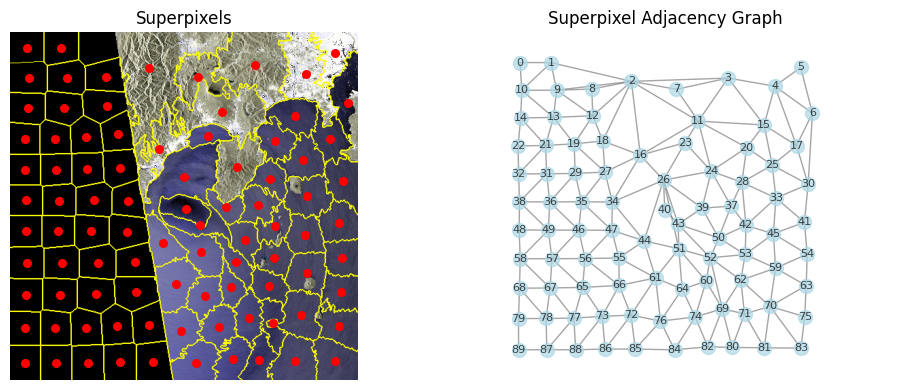

100%|██████████| 10000/10000 [00:19<00:00, 502.37it/s]


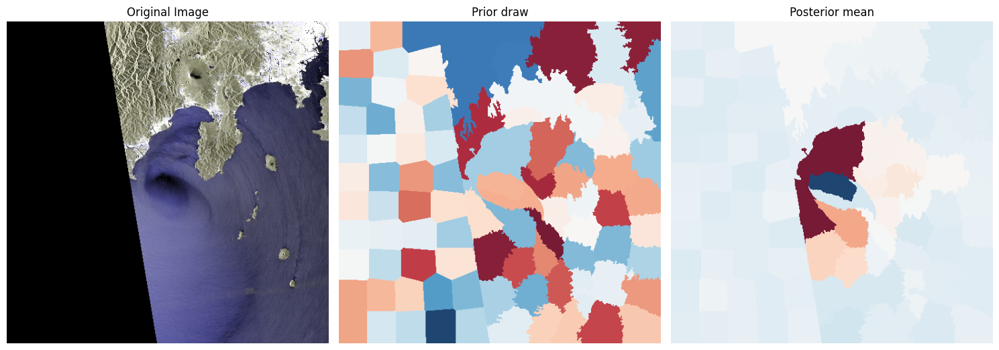

Model predictions: tensor([[0.0011, 0.9989]], device='cuda:0', grad_fn=<SoftmaxBackward0>)
LIME image size: (512, 512, 3)


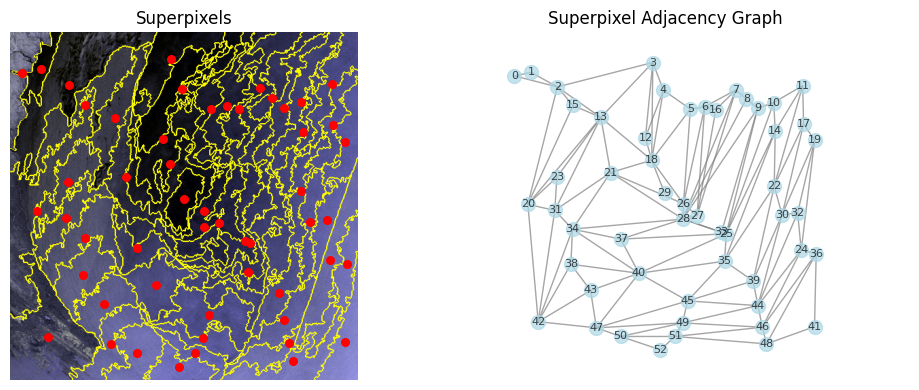

100%|██████████| 10000/10000 [00:13<00:00, 724.72it/s]


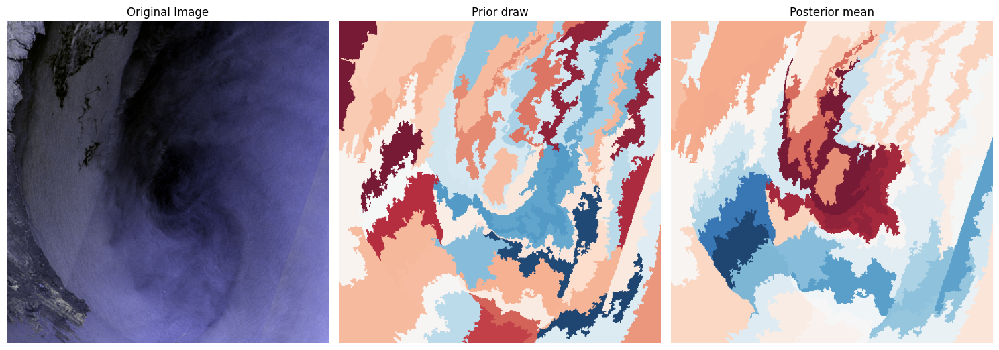

Model predictions: tensor([[0.0011, 0.9989]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


In [ ]:
image_path = '/home/nlfrx7981/uncertainty/data_polar_lows/polar-lows/test/pos/cffe42_20191012T084028_20191012T084212_mos_rgb.png'
image = get_image(image_path)
transformed_image = test_transform(image)
n_samples = 10000  # set number of samples

# Convert tensor to format expected by LIME
lime_image_np = prepare_image_for_lime(transformed_image)
print(f"LIME image size: {lime_image_np.shape}")

explainer = BayesLIME(model, lime_image_np)
superpixels = explainer.custom_slic_segmentation(lime_image_np, n_superpixels=130, compactness=5)
centers = explainer.get_superpixel_centers(superpixels)
adjacency_matrix, degree_matrix = explainer.build_superpixel_graph(superpixels)
explainer.visualize_superpixel_graph(superpixels, centers, adjacency_matrix)

# Bayesian method - MGRF prior - uniform blurring
#prior_mean, prior_precision = explainer.build_prior(adjacency_matrix, degree_matrix, 'graph')
prior_mean_gauss, prior_precision_gauss = explainer.build_prior(adjacency_matrix, degree_matrix, 'gauss')

# Bayesian method - Gaussian prior - uniform blurring 
#prior_example = multivariate_normal.rvs(prior_mean, np.linalg.inv(prior_precision), size=1) # single draw from prior 
prior_example_gaussian = multivariate_normal.rvs(prior_mean_gauss, np.linalg.inv(prior_precision_gauss), size=1)

# model predictions - select method between 'blurred' and 'spatial'
y, interp_features, target_class = explainer.model_predictions_perturbations(lime_image_np, superpixels, 'blurred', n_samples)

# posterior updates MGRF
#posterior_mean, posterior_precision = explainer.build_MGRF_posterior(prior_precision, interp_features, y) 

# posterior updates gauss
posterior_mean_gauss, posterior_precision_gauss = explainer.build_MGRF_posterior(prior_precision_gauss, interp_features, y) 

# plotting
#posterior_example = multivariate_normal.rvs(posterior_mean, np.linalg.inv(posterior_precision), size=1)
#explainer.plot_superpixel_heatmap_prior_posterior(superpixels, prior_mean, prior_precision, posterior_mean, posterior_precision)
explainer.plot_superpixel_heatmap_prior_posterior(superpixels, prior_mean_gauss, prior_precision_gauss, posterior_mean_gauss, posterior_precision_gauss)

print(f'Model predictions: {torch.softmax(logits_sample_img, dim=1)}')


####################

image_path = '/home/nlfrx7981/uncertainty/data_polar_lows/polar-lows/test/pos/e8b0d4_20181231T025037_20181231T025219_mos_rgb.png'

image = get_image(image_path)
transformed_image = test_transform(image)
n_samples = 10000  # set number of samples

# Convert tensor to format expected by LIME
lime_image_np = prepare_image_for_lime(transformed_image)
print(f"LIME image size: {lime_image_np.shape}")

explainer = BayesLIME(model, lime_image_np)
superpixels = explainer.custom_slic_segmentation(lime_image_np, n_superpixels=60, compactness=1)
centers = explainer.get_superpixel_centers(superpixels)
adjacency_matrix, degree_matrix = explainer.build_superpixel_graph(superpixels)
explainer.visualize_superpixel_graph(superpixels, centers, adjacency_matrix)

# Bayesian method - MGRF prior - uniform blurring
#prior_mean, prior_precision = explainer.build_prior(adjacency_matrix, degree_matrix, 'graph')
prior_mean_gauss, prior_precision_gauss = explainer.build_prior(adjacency_matrix, degree_matrix, 'gauss')

# Bayesian method - Gaussian prior - uniform blurring 
#prior_example = multivariate_normal.rvs(prior_mean, np.linalg.inv(prior_precision), size=1) # single draw from prior 
prior_example_gaussian = multivariate_normal.rvs(prior_mean_gauss, np.linalg.inv(prior_precision_gauss), size=1)

# model predictions - select method between 'blurred' and 'spatial'
y, interp_features, target_class = explainer.model_predictions_perturbations(lime_image_np, superpixels, 'blurred', n_samples)

# posterior updates MGRF
#posterior_mean, posterior_precision = explainer.build_MGRF_posterior(prior_precision, interp_features, y) 

# posterior updates gauss
posterior_mean_gauss, posterior_precision_gauss = explainer.build_MGRF_posterior(prior_precision_gauss, interp_features, y) 

# plotting
#posterior_example = multivariate_normal.rvs(posterior_mean, np.linalg.inv(posterior_precision), size=1)
#explainer.plot_superpixel_heatmap_prior_posterior(superpixels, prior_mean, prior_precision, posterior_mean, posterior_precision)
explainer.plot_superpixel_heatmap_prior_posterior(superpixels, prior_mean_gauss, prior_precision_gauss, posterior_mean_gauss, posterior_precision_gauss)

print(f'Model predictions: {torch.softmax(logits_sample_img, dim=1)}')

## Analysis of Misclassified Images

In [ ]:
misc1 = misclassified_images[2]
misc2 = misclassified_images[7]

## False Negative

Generating LIME explanation...


100%|██████████| 1000/1000 [00:08<00:00, 112.58it/s]


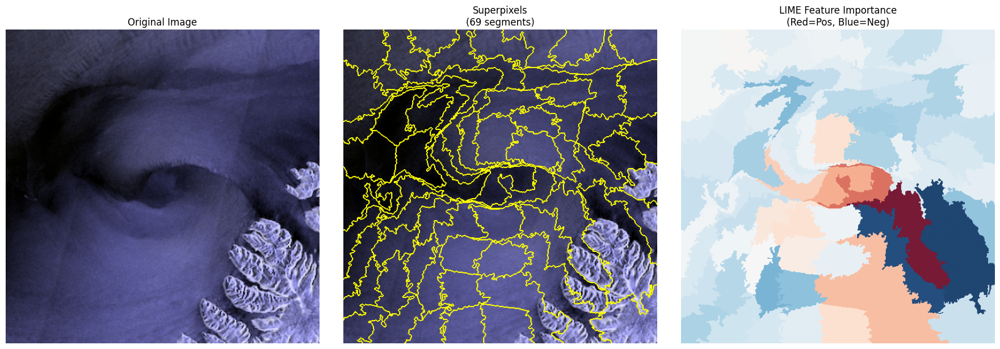

In [ ]:
# standard LIME
transformed_image = test_transform(to_pil_image(misc2))

explanation, lime_image_np, segments = run_standard_lime(
    model, transformed_image, device, 
    n_samples=1000,  # Match simple
    n_superpixels=80, 
    compactness=5,  # Match simple
    top_k=5
)

100%|██████████| 10000/10000 [00:13<00:00, 725.32it/s]


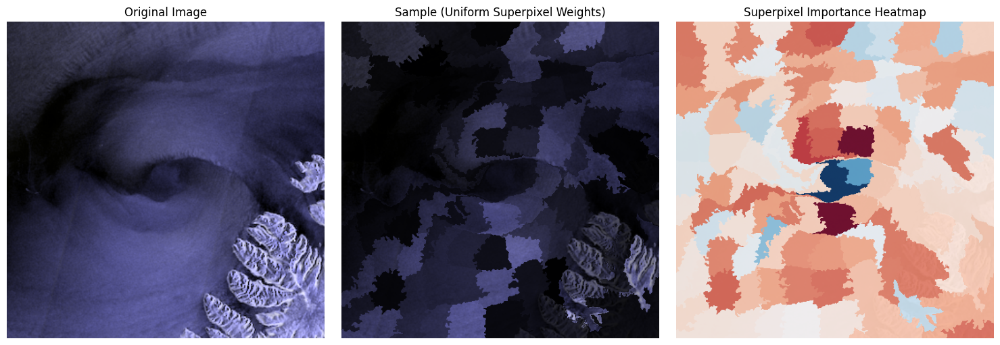

In [ ]:
# blurred LIME

lime_image_np = prepare_image_for_lime(transformed_image)

beta, segments = explain_image(lime_image_np, n_samples=10000)

samples, segments, interp_features = uniform_blurred_sampling(lime_image_np, num_samples=10)

plot_explanation_with_samples(lime_image_np, segments, beta, interp_features, sample_idx=3)


LIME image size: (512, 512, 3)


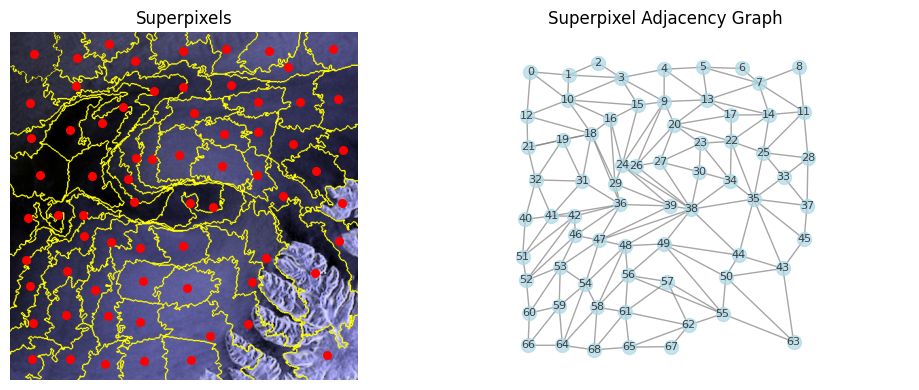

100%|██████████| 10000/10000 [00:16<00:00, 603.43it/s]


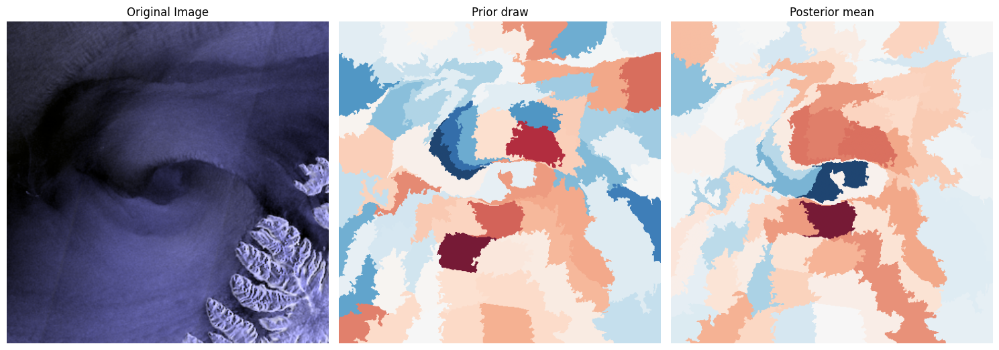

In [ ]:
# Bayes LIME 
n_samples = 10000
lime_image_np = prepare_image_for_lime(transformed_image)
print(f"LIME image size: {lime_image_np.shape}")

explainer = BayesLIME(model, lime_image_np)
superpixels = explainer.custom_slic_segmentation(lime_image_np, n_superpixels=80, compactness=5)
centers = explainer.get_superpixel_centers(superpixels)
adjacency_matrix, degree_matrix = explainer.build_superpixel_graph(superpixels)
explainer.visualize_superpixel_graph(superpixels, centers, adjacency_matrix)

# Bayesian method - MGRF prior - uniform blurring
#prior_mean, prior_precision = explainer.build_prior(adjacency_matrix, degree_matrix, 'graph')
prior_mean_gauss, prior_precision_gauss = explainer.build_prior(adjacency_matrix, degree_matrix, 'gauss')

# Bayesian method - Gaussian prior - uniform blurring 
#prior_example = multivariate_normal.rvs(prior_mean, np.linalg.inv(prior_precision), size=1) # single draw from prior 
prior_example_gaussian = multivariate_normal.rvs(prior_mean_gauss, np.linalg.inv(prior_precision_gauss), size=1)

# model predictions - select method between 'blurred' and 'spatial'
y, interp_features, target_class = explainer.model_predictions_perturbations(lime_image_np, superpixels, 'blurred', n_samples)

# posterior updates MGRF
#posterior_mean, posterior_precision = explainer.build_MGRF_posterior(prior_precision, interp_features, y) 

# posterior updates gauss
posterior_mean_gauss, posterior_precision_gauss = explainer.build_MGRF_posterior(prior_precision_gauss, interp_features, y) 

# plotting
#posterior_example = multivariate_normal.rvs(posterior_mean, np.linalg.inv(posterior_precision), size=1)
#explainer.plot_superpixel_heatmap_prior_posterior(superpixels, prior_mean, prior_precision, posterior_mean, posterior_precision)
explainer.plot_superpixel_heatmap_prior_posterior(superpixels, prior_mean_gauss, prior_precision_gauss, posterior_mean_gauss, posterior_precision_gauss)